<a href="https://colab.research.google.com/github/sgfernandes/EDA_EMIS/blob/main/ESTCP_BuildingStockAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## DOD ESTCP Project
###  
###  Data-driven approaches to building stock analysis: Applying natural language processing and artificial intelligence to identify EMIS ready buildings

March-April 2023

Sam Fernandes, Eliot Crowe, Cameron Guy

### Outline of analysis

Background project 


Description of dataset provided

Data pre-processing


Preliminary exploratory data results
- High level EDA [Summary Stats]
- Large, Small, Medium building CFM/sqft
- Age of HVAC components [ERCIP] 
- System complexity [Number of HVAC components]
- Utility source type
- HVAC configuration type [Centralized vs non-centralized]



Natural language processing
- Keywords
- Vectorization
- Topic modeling
- k-means clustering

Summary and Next Steps



References








## Pre-processing

In [107]:
from google.colab import drive
import pandas as pd
import matplotlib as plt
import numpy as np
import seaborn as sns


%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

drive.mount('/content/gdrive')
s1=pd.read_excel('/content/gdrive/Shareddrives/108644 - ESTCP EMIS Tech Transfer/01 - Needs Assessment Task 1/Bldg stock assessment/S1.xlsx')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Deleting date installed and year constructed columns. These two columns are redundent because the Age and CompAge provide the same information. 

Deleting the non-HVAC componnents by filtering out the SystemType column to only HVAC.



In [108]:
# https://stackoverflow.com/questions/11350770/filter-pandas-dataframe-by-substring-criteria
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html 

s2=s1[s1['SystemType'].str.contains("D30 HVAC")]
s2=s2.drop(columns=['YearConstructed', 'Date_Installed'])

Number of unique installations

In [109]:
#https://stackoverflow.com/questions/45759966/counting-unique-values-in-a-column-in-pandas-dataframe-like-in-qlik 
s2['ANON-INSTALL'].nunique()

558

Number of buildings at each installation


In [110]:
#https://stackoverflow.com/questions/43000308/pandascount-accumulated-unique-values-based-on-another-column
#https://stackoverflow.com/questions/43392588/how-to-change-the-figure-size-of-dataframe-hist-for-pandas-0-11-0
#https://www.geeksforgeeks.org/how-to-change-the-number-of-ticks-in-matplotlib/
group = s2.groupby('ANON-INSTALL')['Anon-BLDG'].nunique()

<Axes: xlabel='Number of Installations', ylabel='Number of Buildings'>

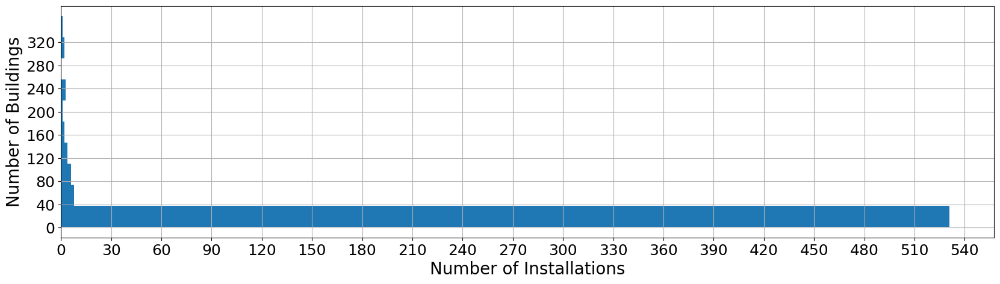

In [19]:
import matplotlib.pyplot as plt
import numpy as np
fig=plt.figure(figsize = (20,5))
ax = fig.gca()
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Number of Installations', fontsize=20)
plt.ylabel('Number of Buildings', fontsize=20)
plt.locator_params(axis='both', nbins=10)
plt.xticks(np.arange(0, 600, 30))
plt.yticks(np.arange(0, 360, 40))
group.hist(ax=ax,orientation='horizontal')

Number of buildings at each location

In [111]:
# https://stackoverflow.com/questions/48979604/pandas-for-each-unique-value-in-one-column-get-unique-values-in-another-column
# https://sparkbyexamples.com/pandas/pandas-set-index-to-column-in-dataframe/
# https://stackabuse.com/how-to-get-the-max-element-of-a-pandas-dataframe-rows-columns-entire-dataframe/
# https://stackoverflow.com/questions/58987790/how-to-plot-graph-against-index-in-python
group = s2.groupby('ANON-INSTALL')

In [112]:
df2 = group.apply(lambda x: x['Anon-BLDG'].unique())

In [113]:
df2 = df2.apply(pd.Series)
df3=df2.fillna(0)

In [114]:
max_elements = df3.max(axis=1)

In [24]:
mean_n=max_elements.mean()

Text(0, 0.5, 'Number of Buildings')

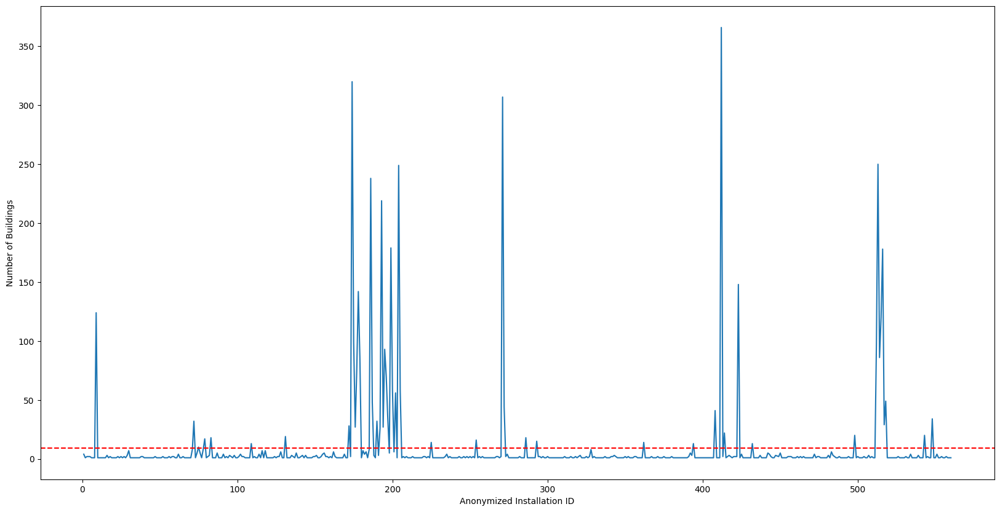

In [33]:
max_elements.plot(y='1',figsize=(20,10))
plt.axhline(mean_n, color='r', linestyle='--')
plt.xlabel("Anonymized Installation ID")
plt.ylabel("Number of Buildings")

Total number of buildings we have in the dataset

In [115]:
import numpy as np
np.count_nonzero(df3)

5084

Age of each building

In [116]:
# https://jamesrledoux.com/code/group-by-aggregate-pandas
# https://sparkbyexamples.com/pandas/pandas-groupby-multiple-columns/ 
grouped_multiple = s2.groupby(['ANON-INSTALL', 'Anon-BLDG']).agg({'Age': ['mean', 'min', 'max']})

In [29]:
grouped_multiple.columns = ['age_mean', 'age_min', 'age_max']

In [30]:
grouped_multiple = grouped_multiple.reset_index()

In [31]:
mean=grouped_multiple['age_mean'].mean()
median = grouped_multiple['age_mean'].median()

Text(0, 0.5, 'Age of building in years')

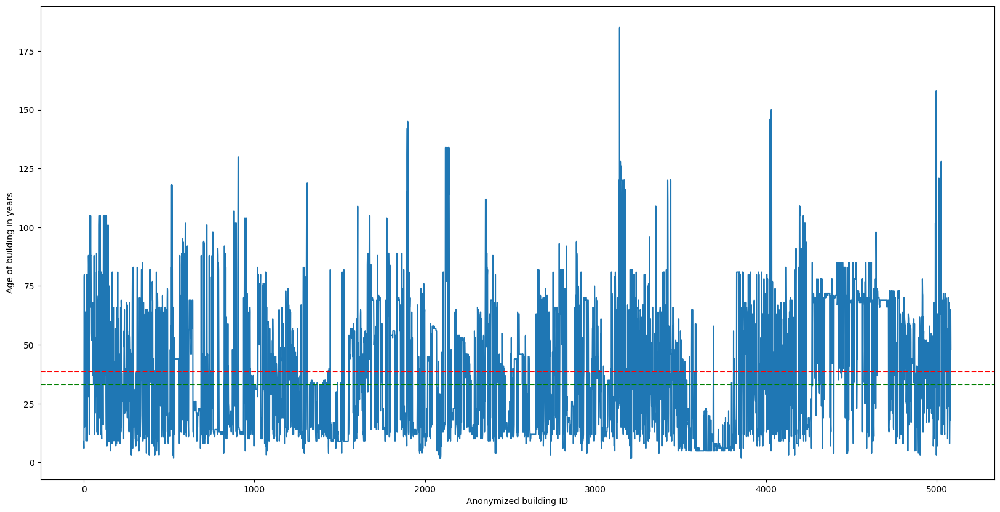

In [34]:
grouped_multiple.plot(y='age_mean',use_index=True,legend=None,figsize=(20,10))
plt.axhline(mean, color='r', linestyle='--', label='mean')
plt.axhline(median, color='g', linestyle='--')
plt.xlabel("Anonymized building ID")
plt.ylabel("Age of building in years")

In [35]:
print(mean)
print(median)

38.41392372776229
33.0


Facility size of each building 

In [36]:
# https://jamesrledoux.com/code/group-by-aggregate-pandas
# https://sparkbyexamples.com/pandas/pandas-groupby-multiple-columns/ 
grouped_multiple_size = s2.groupby(['ANON-INSTALL', 'Anon-BLDG']).agg({'FacilitySize': ['mean', 'min', 'max']})

In [37]:
grouped_multiple_size.columns = ['facsize_mean', 'facsize_min', 'facsize_max']

In [38]:
grouped_multiple_size = grouped_multiple_size.reset_index()

In [39]:
# Get rid of bad data. 564654564 sqft
grouped_multiple_size=grouped_multiple_size[grouped_multiple_size.facsize_mean !=564654564]

In [40]:
mean=grouped_multiple_size['facsize_mean'].mean()
median = grouped_multiple_size['facsize_mean'].median()

Text(0, 0.5, 'Square footage of building in sqft (10^6)')

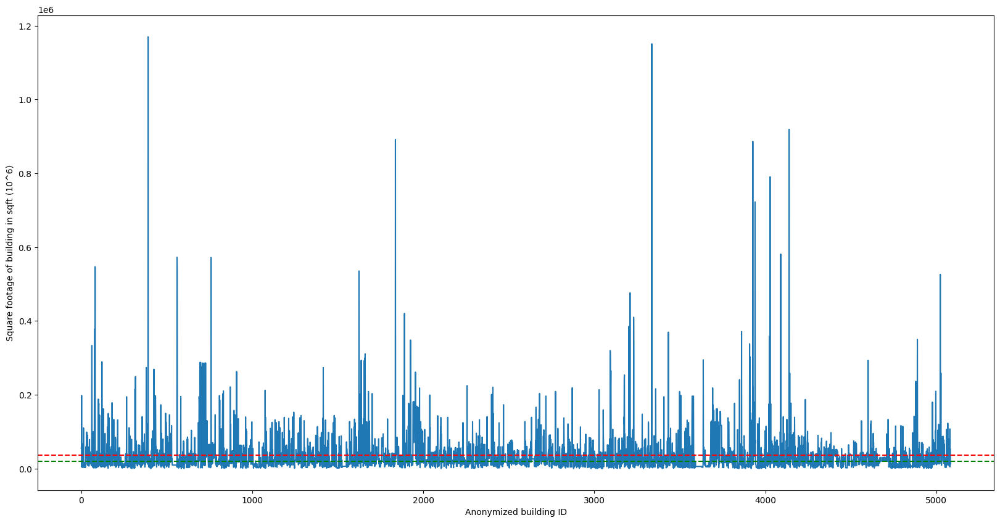

In [41]:
grouped_multiple_size.plot(y='facsize_mean',use_index=True,legend=None,figsize=(20,10))
plt.axhline(mean, color='r', linestyle='--')
plt.axhline(median, color='g', linestyle='--')

plt.xlabel("Anonymized building ID")
plt.ylabel("Square footage of building in sqft (10^6)")

In [42]:
mean

36797.53446893302

In [43]:
median


20442.0

Number of unique values in every column in pandas dataframe

In [44]:
# https://stackoverflow.com/questions/27241253/print-the-unique-values-in-every-column-in-a-pandas-dataframe
# https://stackoverflow.com/questions/30503321/finding-count-of-distinct-elements-in-dataframe-in-each-column 


In [45]:
print(s2.apply(lambda col: col.unique()))

ANON-INSTALL         [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
Anon-BLDG            [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...
CATCODE              [17180, 21110, 21407, 21413, 17140, 21409, 442...
Age                  [9, 6, 79, 80, 15, 17, 61, 64, 59, 57, 21, 18,...
FacilitySize         [55199, 58657, 198105, 3801, 67106, 36171, 618...
CI                   [90.59727505679376, 94.06742814233979, 73.8504...
SystemType                                                  [D30 HVAC]
Control_Type_Make    [DDC, CONSTANT VOLUME DDC, DDC CONSTANT VOLUME...
Equipment_Type       [Chiller, HYDRONIC AHU, AIR HANDLER, CHILLER R...
Capacity             [60 TON, 10000 CFM, 3500 CFM, 5000 CFM, 7500 C...
CompAge              [9.0, 6.0, 3.0, 18.0, 19.0, 79.0, 10.0, 15.0, ...
dtype: object


In [46]:
s2.nunique()

ANON-INSTALL          558
Anon-BLDG             366
CATCODE               256
Age                   130
FacilitySize         4101
CI                   5094
SystemType              1
Control_Type_Make      54
Equipment_Type       1351
Capacity             4078
CompAge                79
dtype: int64

## Normalization of capacity

Drop all rows that have NaN value in capacity

In [47]:
# https://stackoverflow.com/questions/13413590/how-to-drop-rows-of-pandas-dataframe-whose-value-in-a-certain-column-is-nan

In [117]:
sc=s2 # Move s2 to new dataframe to work on it

In [118]:
sc=sc[sc['Capacity'].notna()] # 23902-21328= 2574 lost rows due to dropping NaN
sc=sc[sc['Equipment_Type'].notna()] # 21328-20854=474 lost rows due to dropping NaN

Split the Capacity column into two columns, one with numeric and one with text.

In [119]:
# https://stackoverflow.com/questions/14745022/how-to-split-a-dataframe-string-column-into-two-columns
sc1 = pd.DataFrame(sc.Capacity.str.split(' ',1).tolist(),columns = ['value','unit'])

<ipython-input-119-f25ba7977d3d>:2: FutureWarning: In a future version of pandas all arguments of StringMethods.split except for the argument 'pat' will be keyword-only.
  sc1 = pd.DataFrame(sc.Capacity.str.split(' ',1).tolist(),columns = ['value','unit'])


In [120]:
sc1

,value,unit
0,60,TON
1,10000,CFM
2,3500,CFM
3,5000,CFM
4,7500,CFM
...,...,...
20849,"80,000",BTU
20850,1500,CFM EST
20851,5000,CFM EST
20852,15,HP


In [121]:
sc1.nunique()

value    1822
unit      740
dtype: int64

In [122]:
print(sc1.apply(lambda col: col.unique()))

value    [60, 10000, 3500, 5000, 7500, 12000, 15000, 80...
unit     [TON, CFM, CFM (Estimated), MBH, HP, CFM, 53.5...
dtype: object


In [123]:
sc1['unit']=sc1['unit'].str.upper() # Make all upper https://www.geeksforgeeks.org/apply-uppercase-to-a-column-in-pandas-dataframe/

In [124]:
sc1['unit']=sc1['unit'].str.replace("EST","") # Remove EST, Estimated

In [125]:
sc1['unit']=sc1['unit'].str.replace("(IMATED)","")

<ipython-input-125-7c82591c62bc>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  sc1['unit']=sc1['unit'].str.replace("(IMATED)","")


In [126]:
sc1['unit']=sc1['unit'].str.replace(")","") # Remove the empty brackets

<ipython-input-126-806ebe1e2bf2>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  sc1['unit']=sc1['unit'].str.replace(")","") # Remove the empty brackets


In [127]:
sc1.replace(',','',regex=True, inplace=True) # https://stackoverflow.com/questions/56947333/how-to-remove-commas-from-all-the-column-in-pandas-at-once

In [128]:
print(sc1.dtypes)

value    object
unit     object
dtype: object


In [129]:
#sc1['value'].astype(str).astype(float) # https://stackoverflow.com/questions/39173813/pandas-convert-dtype-object-to-int

In [130]:
sc1

,value,unit
0,60,TON
1,10000,CFM
2,3500,CFM
3,5000,CFM
4,7500,CFM
...,...,...
20849,80000,BTU
20850,1500,CFM
20851,5000,CFM
20852,15,HP


Keep only the first three characters of the units column

In [131]:
sc1['unit'] = sc1['unit'].str[:3] # https://www.datasciencemadesimple.com/return-first-n-character-from-left-of-column-in-pandas-python/

In [132]:
sc2=sc1

In [133]:
sc3=sc

Merge sc2 with sc3 and then delete all rows that do not have the correct units that we want to work with. 

In [134]:
# https://www.tutorialspoint.com/how-to-append-two-dataframes-in-pandas
# https://stackoverflow.com/questions/32801806/pandas-concat-ignore-index-doesnt-work

In [135]:
sc2.reset_index(drop=True, inplace=True)
sc3.reset_index(drop=True, inplace=True)

In [136]:
sc4 = pd.concat( [sc2, sc3], axis=1) 

Delete all rows that do not have CFM, TON, HP,MBH,KW in sc2

In [138]:
#df.loc[df['col1'].isin([value1, value2, value3, ...])].  
# https://www.statology.org/pandas-select-rows-based-on-column-values/
sc4=sc4.loc[sc4['unit'].isin(['CFM','TON','HP','MBH','KW'])]

In [139]:
sc4

,value,unit,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge
0,60,TON,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,Chiller,60 TON,9.0
1,10000,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,10000 CFM,9.0
2,3500,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,3500 CFM,9.0
3,5000,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,5000 CFM,9.0
4,7500,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,7500 CFM,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20845,2500,CFM,557,1,17180,18,107413,86.797847,D30 HVAC,DDC,WALL MOUNTED FAN,"2,500 CFM est.",18.0
20850,1500,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,1500 CFM EST,22.0
20851,5000,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,5000 CFM EST,22.0
20852,15,HP,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,7.0


In [140]:
sc4.nunique()

value                1555
unit                    5
ANON-INSTALL          446
Anon-BLDG             366
CATCODE               240
Age                   126
FacilitySize         3227
CI                   3894
SystemType              1
Control_Type_Make      36
Equipment_Type       1088
Capacity             2938
CompAge                75
dtype: int64

Reduced the number of entries in the capacity from 2938 to 5 after data cleaning and processing steps. 



Conversion rules:

1 Ton=400CFM

1 HP= 4.8 CFM

1 MBH=33 CFM

1KW=4 CFM


In [141]:
# https://www.geeksforgeeks.org/how-to-add-empty-column-to-dataframe-in-pandas/

In [142]:
sc4['Normalized']=''#Blank column where normalized values will reside

<ipython-input-142-1d6300d764ae>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc4['Normalized']=''#Blank column where normalized values will reside


In [144]:
# https://stackoverflow.com/questions/26886653/create-new-column-based-on-values-from-other-columns-apply-a-function-of-multi
def normalize(row):
  if row['unit']== 'TON':
    return (row['value']*400)
  if row['unit']== 'HP':
    return (row['value']*4.8)
  if row['unit']== 'MBH':
    return (row['value']*33)
  if row['unit']== 'KW':
    return (row['value']*4)
  return row['value']

In [145]:
sc4

,value,unit,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized
0,60,TON,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,Chiller,60 TON,9.0,
1,10000,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,10000 CFM,9.0,
2,3500,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,3500 CFM,9.0,
3,5000,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,5000 CFM,9.0,
4,7500,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,7500 CFM,9.0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20845,2500,CFM,557,1,17180,18,107413,86.797847,D30 HVAC,DDC,WALL MOUNTED FAN,"2,500 CFM est.",18.0,
20850,1500,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,1500 CFM EST,22.0,
20851,5000,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,5000 CFM EST,22.0,
20852,15,HP,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,7.0,


Convert column to int or float

In [146]:
# https://stackoverflow.com/questions/70361517/python-pandas-valueerror-invalid-literal-for-int-with-base-10
#df['year'] = df['year'].apply(pd.to_numeric, errors='coerce').fillna(0.0)
sc4['value']=sc4['value'].apply(pd.to_numeric, errors='coerce').fillna(0.0)

<ipython-input-146-6ac13c2d9e56>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc4['value']=sc4['value'].apply(pd.to_numeric, errors='coerce').fillna(0.0)


Run function to convert to normalized unit

In [147]:
sc4['Normalized']=sc4.apply (lambda row:normalize(row),axis=1)

<ipython-input-147-c7dc1d05e73a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sc4['Normalized']=sc4.apply (lambda row:normalize(row),axis=1)


In [148]:
## https://stackoverflow.com/questions/49161120/set-value-of-one-pandas-column-based-on-value-in-another-column
sc4.dtypes

value                float64
unit                  object
ANON-INSTALL           int64
Anon-BLDG              int64
CATCODE               object
Age                   object
FacilitySize          object
CI                    object
SystemType            object
Control_Type_Make     object
Equipment_Type        object
Capacity              object
CompAge              float64
Normalized           float64
dtype: object

In [149]:
sc4

,value,unit,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized
0,60.0,TON,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,Chiller,60 TON,9.0,24000.0
1,10000.0,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,10000 CFM,9.0,10000.0
2,3500.0,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,3500 CFM,9.0,3500.0
3,5000.0,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,5000 CFM,9.0,5000.0
4,7500.0,CFM,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,7500 CFM,9.0,7500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20845,2500.0,CFM,557,1,17180,18,107413,86.797847,D30 HVAC,DDC,WALL MOUNTED FAN,"2,500 CFM est.",18.0,2500.0
20850,1500.0,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,1500 CFM EST,22.0,1500.0
20851,5000.0,CFM,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,5000 CFM EST,22.0,5000.0
20852,15.0,HP,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,7.0,72.0


Get rid of unnecessary columns. Change name of normalized column to call is CFM (normalized)

In [150]:
# https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html

sc5=sc4

In [151]:
sc5=sc5.drop(columns=['value','unit'])

In [152]:
sc5=sc5.rename(columns={'Normalized':'Normalized (cfm)'})

In [153]:
sc5

,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized (cfm)
0,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,Chiller,60 TON,9.0,24000.0
1,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,10000 CFM,9.0,10000.0
2,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,3500 CFM,9.0,3500.0
3,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,5000 CFM,9.0,5000.0
4,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,7500 CFM,9.0,7500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
20845,557,1,17180,18,107413,86.797847,D30 HVAC,DDC,WALL MOUNTED FAN,"2,500 CFM est.",18.0,2500.0
20850,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,1500 CFM EST,22.0,1500.0
20851,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,5000 CFM EST,22.0,5000.0
20852,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,7.0,72.0


In [154]:
sc5.nunique()

ANON-INSTALL          446
Anon-BLDG             366
CATCODE               240
Age                   126
FacilitySize         3227
CI                   3894
SystemType              1
Control_Type_Make      36
Equipment_Type       1088
Capacity             2938
CompAge                75
Normalized (cfm)     1733
dtype: int64

## Plot capacity of HVAC Units

In [87]:
# https://jamesrledoux.com/code/group-by-aggregate-pandas
# https://sparkbyexamples.com/pandas/pandas-groupby-multiple-columns/ 
grouped_multiple_cap = sc5.groupby(['ANON-INSTALL', 'Anon-BLDG']).agg({'Normalized (cfm)': ['mean', 'min', 'max']})

In [88]:
grouped_multiple_cap.columns = ['cap_mean', 'cap_min', 'cap_max']

In [89]:
grouped_multiple_cap = grouped_multiple_cap.reset_index()

In [99]:
mean=grouped_multiple_cap['cap_mean'].mean()
median = grouped_multiple_cap['cap_mean'].median()

Text(0, 0.5, 'Normalized HVAC system capacity (cfm)')

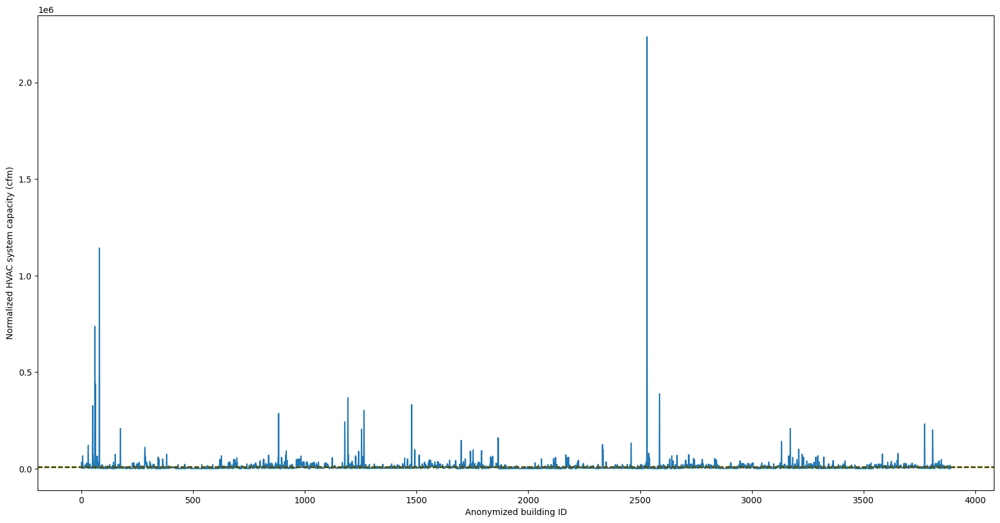

In [101]:
import matplotlib.pyplot as plt
grouped_multiple_cap.plot(y='cap_mean',use_index=True,legend=None,figsize=(20,10))
plt.axhline(mean, color='r', linestyle='--', label='mean')
plt.axhline(median, color='g', linestyle='--')
plt.xlabel("Anonymized building ID")
plt.ylabel("Normalized HVAC system capacity (cfm)")

In [103]:
mean

9950.064453791252

In [104]:
median

4004.0

In [92]:
sc5.nunique()

ANON-INSTALL          446
Anon-BLDG             366
CATCODE               240
Age                   126
FacilitySize         3227
CI                   3894
SystemType              1
Control_Type_Make      36
Equipment_Type       1088
Capacity             2938
CompAge                75
Normalized (cfm)     1733
dtype: int64

In [93]:
sc5

,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized (cfm)
0,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,Chiller,60 TON,9.0,24000.0
1,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,10000 CFM,9.0,10000.0
2,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,3500 CFM,9.0,3500.0
3,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,5000 CFM,9.0,5000.0
4,1,1,17180,9,55199,90.597275,D30 HVAC,DDC,HYDRONIC AHU,7500 CFM,9.0,7500.0
...,...,...,...,...,...,...,...,...,...,...,...,...
20845,557,1,17180,18,107413,86.797847,D30 HVAC,DDC,WALL MOUNTED FAN,"2,500 CFM est.",18.0,2500.0
20850,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,1500 CFM EST,22.0,1500.0
20851,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,AIR HANDLING UNIT,5000 CFM EST,22.0,5000.0
20852,558,1,17180,22,54038,80.743901,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,7.0,72.0


From this dataset, what are the EMIS ready buildings?

Filtering based on conditions. E.G. If condition good and sqft greater than 50sqft

Data Analysis Steps

Data-driven approach for EMIS readiness in buildings [ Jamboard ]


1] Step 1
- Just size?
- Size and condition index?
- What are the types of controls fro all the CI>80 and other CI's [ Green ]
- Repeat the same for building size - controls
- Split the CI on size also
- Smaller buildings with CI&DDC but may not be EMIS ready

2] Step 2
Maybe another cutoff for CI?

3] Step 3
Large building with low CFM could be way to screen out?

4] Step 4
Buildings with packaged units

5] Step 5
Plot buildings with different kinds of HVAC


6] Technincal potential
Bucket list of which one's are ready for EMIS and which type of EMIS
Form



4] References


https://jamboard.google.com/d/1uzvK-8t-oJJEw-hLRSgCfX4-vKwWsQByG-aZcK81n-0/viewer?f=1

In [94]:
# https://jamesrledoux.com/code/group-by-aggregate-pandas
# https://sparkbyexamples.com/pandas/pandas-groupby-multiple-columns/ 
grouped_multiple_comp = sc5.groupby(['ANON-INSTALL', 'Anon-BLDG']).agg({'CompAge': ['mean', 'min', 'max']})

In [95]:
grouped_multiple_comp.columns = ['comp_mean', 'comp_min', 'comp_max']

In [96]:
grouped_multiple_comp = grouped_multiple_comp.reset_index()

In [97]:
#mean=grouped_multiple['age_mean'].mean()
# median = grouped_multiple['age_mean'].median()

Text(0, 0.5, 'Average age of HVAC component (yrs)')

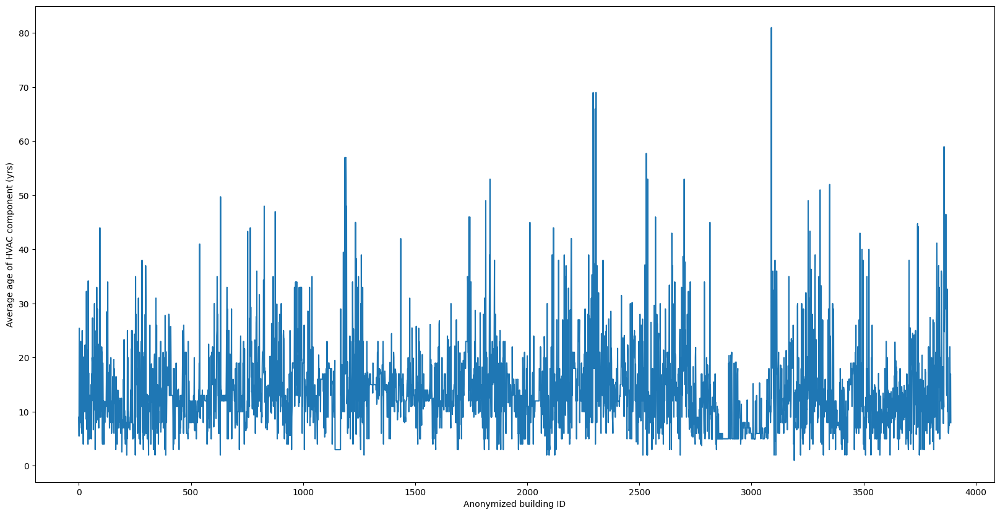

In [98]:
import matplotlib.pyplot as plt

grouped_multiple_comp.plot(y='comp_mean',use_index=True,legend=None,figsize=(20,10))
#plt.axhline(grouped_multiple_cap.cap_mean, color='r', linestyle='--', label='mean')
#plt.axhline(median, color='g', linestyle='--')

plt.xlabel("Anonymized building ID")
plt.ylabel("Average age of HVAC component (yrs)")


In [ ]:
# https://jamesrledoux.com/code/group-by-aggregate-pandas
# https://sparkbyexamples.com/pandas/pandas-groupby-multiple-columns/ 
grouped_multiple = s2.groupby(['ANON-INSTALL', 'Anon-BLDG']).agg({'Age': ['mean', 'min', 'max']})

In [ ]:
sc5['CICode']=''#Blank column where normalized values will reside

In [ ]:
# https://stackoverflow.com/questions/26886653/create-new-column-based-on-values-from-other-columns-apply-a-function-of-multi
def condition(row):
  if row['CI']>='86':
    return 'G'
  if row['CI']>= '75' & row['CI']<'86' :
    return 'Y'
  if row['unit']== 'MBH':
    return (row['value']*33)
  if row['unit']== 'KW':
    return (row['value']*4)
  return row['value']

In [ ]:
sc5

## Equipment type and control

Control type reduces to only two different types of names DDC and BAS. There are many different configurations of DDC.

Equipment type is more diverse. 

## Histogram of types of names and controls

In [ ]:
# https://stackoverflow.com/questions/29525120/pandas-creating-a-histogram-from-string-counts
# https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
sc5.Control_Type_Make.value_counts().plot.barh(figsize=(20, 18))


In [ ]:
r=sc5.Equipment_Type.value_counts()

In [ ]:
r.to_csv('file_name1.csv')

<Axes: >

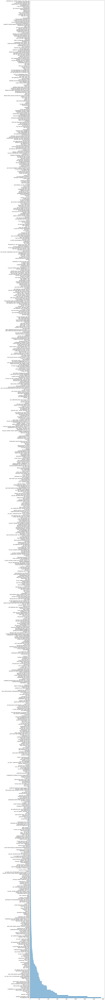

In [ ]:
# https://stackoverflow.com/questions/29525120/pandas-creating-a-histogram-from-string-counts
# https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 14})
sc5.Equipment_Type.value_counts().plot.barh(figsize=(20, 268))


### Large building, high CI and control type

In [ ]:
# https://stackoverflow.com/questions/70361517/python-pandas-valueerror-invalid-literal-for-int-with-base-10
#df['year'] = df['year'].apply(pd.to_numeric, errors='coerce').fillna(0.0)
sc5['Age']=sc5['Age'].apply(pd.to_numeric, errors='coerce').fillna(0.0)
sc5['CI']=sc5['CI'].apply(pd.to_numeric, errors='coerce').fillna(0.0)

In [ ]:
sc5

,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized (cfm),CICode
0,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,12000 CFM (Estimated),6.0,12000.0,
1,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,15000 CFM (Estimated),6.0,15000.0,
2,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,8000 CFM (Estimated),6.0,8000.0,
3,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,CHILLER R410A,100 TON,6.0,40000.0,
4,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,CHILLER R410A,100 TON,3.0,40000.0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18611,551,2,17140,24,28217.0,82.347603,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,7.5 HP,6.0,36.0,
18612,551,3,17140,24,14696,78.711038,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,5 HP,7.0,24.0,
18613,554,2,17140,8,30243.0,91.535128,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,10 HP,8.0,48.0,
18614,554,2,17140,8,30243.0,91.535128,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,2 HP,8.0,9.6,


In [ ]:
rslt_df = sc5[(sc5['CI'] > 70) & (sc5['FacilitySize'] > 25000)]

In [ ]:
rslt_df

,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized (cfm),CICode
0,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,12000 CFM (Estimated),6.0,12000.0,
1,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,15000 CFM (Estimated),6.0,15000.0,
2,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,AIR HANDLER,8000 CFM (Estimated),6.0,8000.0,
3,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,CHILLER R410A,100 TON,6.0,40000.0,
4,1,2,21110,6,58657,94.067428,D30 HVAC,DDC,CHILLER R410A,100 TON,3.0,40000.0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18610,551,2,17140,24,28217.0,82.347603,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,15 HP,6.0,72.0,
18611,551,2,17140,24,28217.0,82.347603,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,7.5 HP,6.0,36.0,
18613,554,2,17140,8,30243.0,91.535128,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,10 HP,8.0,48.0,
18614,554,2,17140,8,30243.0,91.535128,D30 HVAC,DDC,VARIABLE FREQUENCY DRIVE,2 HP,8.0,9.6,


<Axes: >

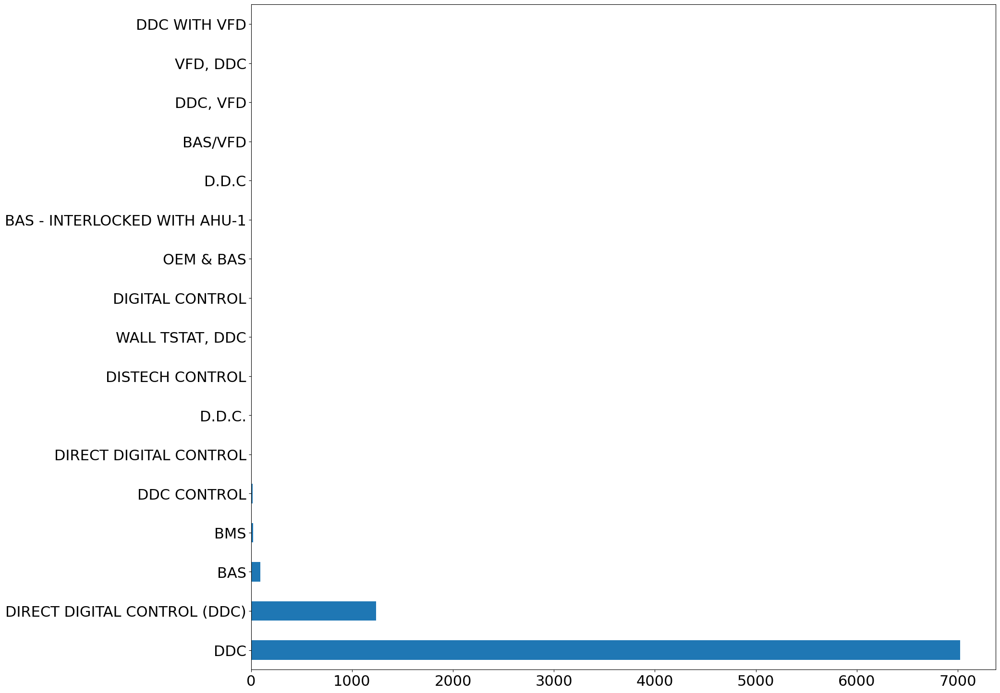

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
rslt_df.Control_Type_Make.value_counts().plot.barh(figsize=(20, 18))

<Axes: >

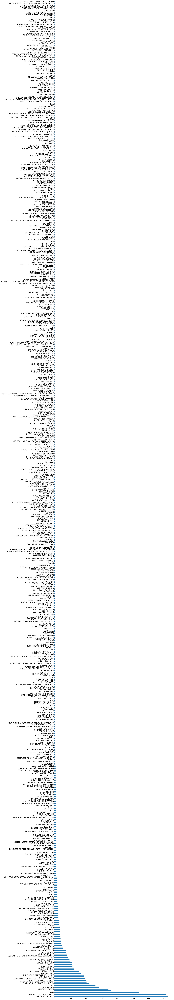

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
rslt_df.Equipment_Type.value_counts().plot.barh(figsize=(20, 168))

In [ ]:
rslt_df1 = sc5[(sc5['CI'] > 70) & (sc5['FacilitySize'] < 25000)]

In [ ]:
rslt_df1

,ANON-INSTALL,Anon-BLDG,CATCODE,Age,FacilitySize,CI,SystemType,Control_Type_Make,Equipment_Type,Capacity,CompAge,Normalized (cfm),CICode
15,1,4,21413,80,3801,74.625370,D30 HVAC,DDC,AIR HANDLER,2000 CFM,10.0,2000.0,
16,1,4,21413,80,3801,74.625370,D30 HVAC,DDC,AIR HANDLER,2000 CFM (Estimated),10.0,2000.0,
17,1,4,21413,80,3801,74.625370,D30 HVAC,DDC,FAN COIL UNIT,1.5 TON,10.0,600.0,
18,4,2,21409,61,4180,81.665395,D30 HVAC,DDC,FAN POWERED,60 MBH (ESTIMATED),8.0,1980.0,
38,9,7,31410,9,10508,90.390130,D30 HVAC,DDC,COMPUTER ROOM,5 TON,9.0,2000.0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18591,548,30,31720,42,14291.0,73.736536,D30 HVAC,DDC,"CHILLER, SCROLL",60 TON,9.0,24000.0,
18594,548,31,74022,48,9272,77.008235,D30 HVAC,DDC,MAKE-UP AIR UNIT,"2,000 CFM EST",25.0,2000.0,
18595,548,31,74022,48,9272,77.008235,D30 HVAC,DDC,MAKE-UP AIR UNIT,"8,000 CFM EST",48.0,8000.0,
18596,548,31,74022,48,9272,77.008235,D30 HVAC,DDC,MAKE-UP AIR UNIT,"8,000 CFM EST",25.0,8000.0,


<Axes: >

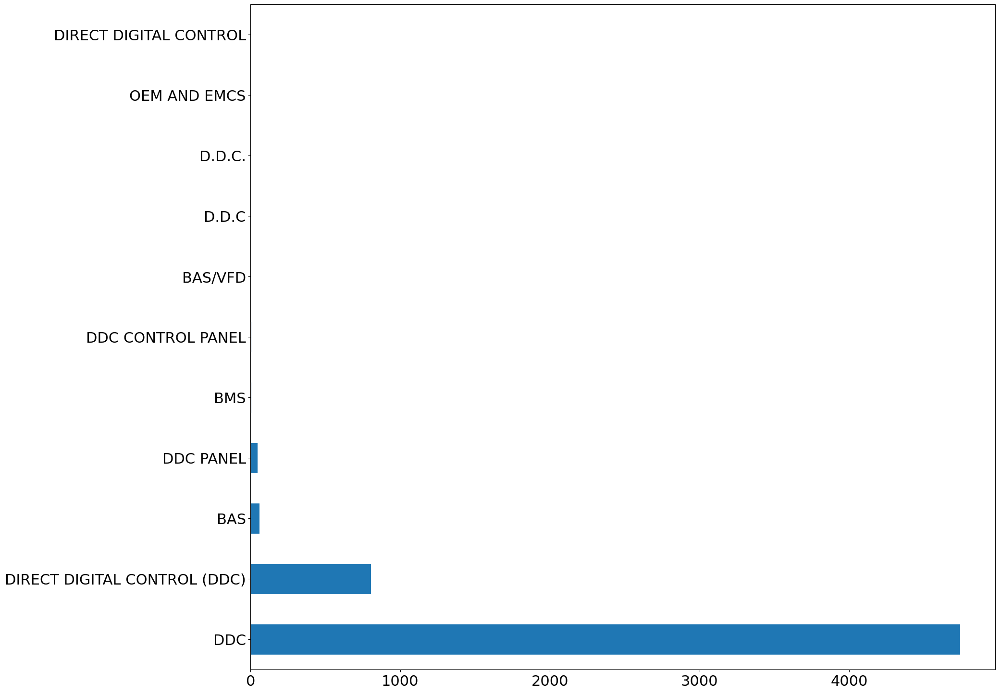

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
rslt_df1.Control_Type_Make.value_counts().plot.barh(figsize=(20, 18))

<Axes: >

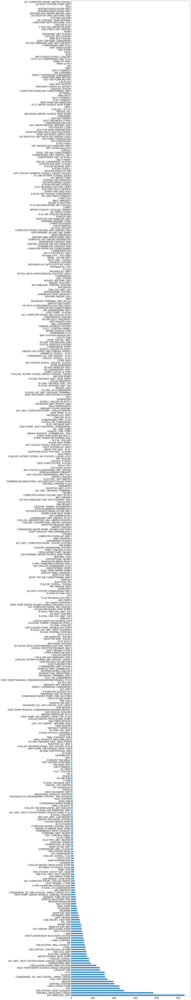

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
rslt_df1.Equipment_Type.value_counts().plot.barh(figsize=(20, 168))

### Scatter cfm vs sqft

In [ ]:
# https://stephenallwright.com/pandas-groupby-sum-another-column/
# https://stackoverflow.com/questions/40353079/pandas-how-to-check-dtype-for-all-columns-in-a-dataframe

In [ ]:
sc5['FacilitySize']=sc5['FacilitySize'].apply(pd.to_numeric, errors='coerce').fillna(0.0)

In [ ]:
grouped_cfm=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG'])['Normalized (cfm)'].sum()

In [ ]:
grouped_cfm

ANON-INSTALL  Anon-BLDG
1             2            131500.0
              3            286972.0
              4              4600.0
4             2              1980.0
9             3             71558.0
                             ...   
548           33            46000.0
              34            16000.0
551           2               156.0
              3                24.0
554           2                81.6
Name: Normalized (cfm), Length: 3467, dtype: float64

In [ ]:
grouped_cfm_size=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG'])['Normalized (cfm)','FacilitySize'].sum()

<ipython-input-135-81beaf9e313e>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  grouped_cfm_size=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG'])['Normalized (cfm)','FacilitySize'].sum()


In [ ]:
grouped_cfm_size

Normalized (cfm)  FacilitySize
ANON-INSTALL Anon-BLDG                                
1            2                  131500.0      351942.0
             3                  286972.0     1782945.0
             4                    4600.0       11403.0
4            2                    1980.0        4180.0
9            3                   71558.0       39540.0
...                                  ...           ...
548          33                  46000.0      259932.0
             34                  16000.0       28534.0
551          2                     156.0       84651.0
             3                      24.0       14696.0
554          2                      81.6       90729.0

[3467 rows x 2 columns]

In [ ]:
grouped_cfm_size_test=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG']).sum()

<ipython-input-137-febc45cb7520>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_cfm_size_test=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG']).sum()


In [ ]:
sc5.dtypes

ANON-INSTALL           int64
Anon-BLDG              int64
CATCODE               object
Age                    int64
FacilitySize         float64
CI                   float64
SystemType            object
Control_Type_Make     object
Equipment_Type        object
Capacity              object
CompAge              float64
Normalized (cfm)     float64
CICode                object
dtype: object

In [ ]:
grouped_cfm_size_test

Age  FacilitySize          CI  CompAge  \
ANON-INSTALL Anon-BLDG                                           
1            2           36      351942.0  564.404569     33.0   
             3          711     1782945.0  664.654147    229.0   
             4          240       11403.0  223.876110     30.0   
4            2           61        4180.0   81.665395      8.0   
9            3          345       39540.0  337.718504     97.0   
...                     ...           ...         ...      ...   
548          33         126      259932.0  516.377299    120.0   
             34          32       28534.0   81.231297     13.0   
551          2           72       84651.0  247.042809     18.0   
             3           24       14696.0   78.711038      7.0   
554          2           24       90729.0  274.605385     24.0   

                        Normalized (cfm)  
ANON-INSTALL Anon-BLDG                    
1            2                  131500.0  
             3                  286972.0  
             4                    4600.0  
4            2                    1980.0  
9            3                   71558.0  
...                                  ...  
548          33                  46000.0  
             34                  16000.0  
551          2                     156.0  
             3                      24.0  
554          2                      81.6  

[3467 rows x 5 columns]

In [ ]:
# https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-a-pandas-dataframe
from scipy import stats
grouped_cfm_size_test=grouped_cfm_size_test[(np.abs(stats.zscore(grouped_cfm_size_test)) < 3).all(axis=1)]


Text(0, 0.5, 'HVAC CFM')

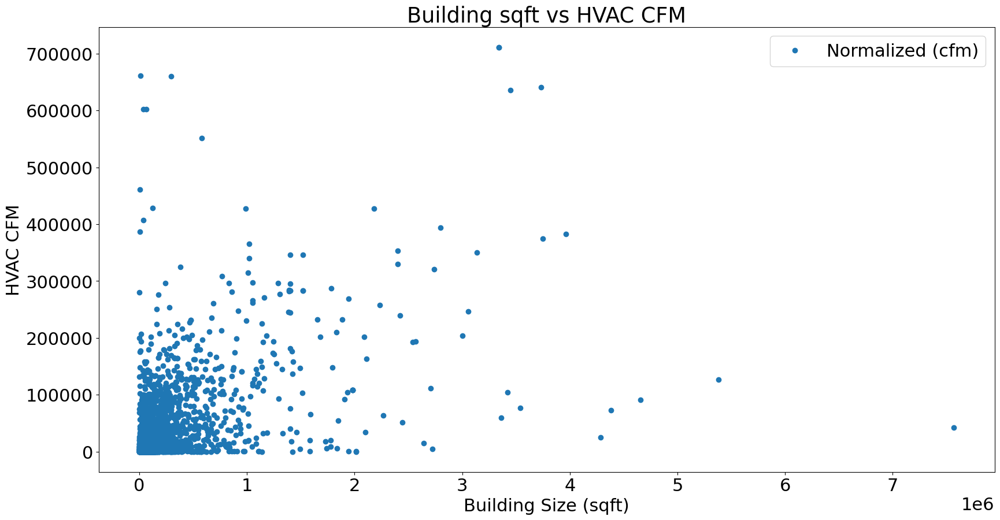

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
ax=grouped_cfm_size_test.plot(x='FacilitySize', y='Normalized (cfm)', style=['o','rx'],title='Building sqft vs HVAC CFM',figsize=(20,10))
ax.set_xlabel("Building Size (sqft)")
ax.set_ylabel("HVAC CFM")

## Building size and cumulative frequency of total sqft

In [ ]:
bs_cf=grouped_cfm_size_test

In [ ]:
bs_cf=bs_cf.sort_values(by=['FacilitySize'])

In [ ]:
bs_cf.dtypes

Age                   int64
FacilitySize        float64
CI                  float64
CompAge             float64
Normalized (cfm)    float64
dtype: object

Text(0, 0.5, 'HVAC CFM')

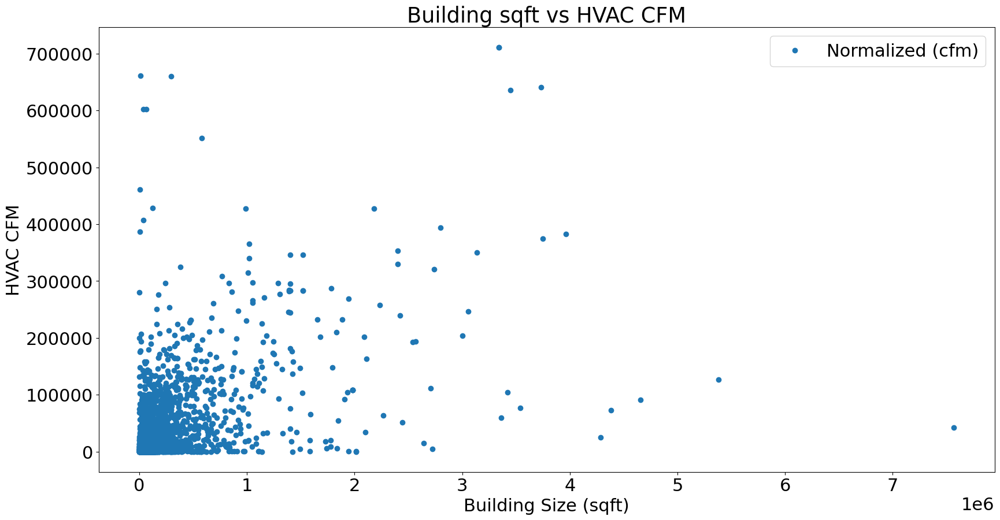

In [ ]:

ax=grouped_cfm_size_test.plot(x='FacilitySize', y='Normalized (cfm)', style=['o','rx'],title='Building sqft vs HVAC CFM',figsize=(20,10))
ax.set_xlabel("Building Size (sqft)")
ax.set_ylabel("HVAC CFM")

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})
bs_cf.FacilitySize.plot.bar(alpha=0.8,figsize=(20,10))
#bs_cf.FacilitySize.cumsum().plot(color='k', kind='line')
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.show()


In [ ]:
bs_cf

In [ ]:
grouped_facsize=sc5.groupby(['ANON-INSTALL', 'Anon-BLDG'])['FacilitySize'].sum()

In [ ]:
grouped_facsize

In [ ]:
sc5.dtypes

In [ ]:
sc5